# Healthcare Fraud --- II Models 

# Objectives
This notebook will conduct an analysis of the Fraud, Waste, and Abuse of Medical resources. I will focus on detecting any hospital that may abuse the resources compared to its peers of the same features, location, or each diagnosis group.

# Dataset
The dataset is from the Medicare Inpatient Hospitals by Geography and service that provides information on hospital discharges. Please see more information in "Healthcare Fraud --- I EDA&Feature Engineering".

# Models
I will perform various techniques to identify fraud in the healthcare industry and follow modeling procedures for the model development, assessment, and interpretation of the results. 
* Model development
* Threshold determination
* Descriptive statistics of the normal and abnormal groups

Python Outlier Detection (PyOD) module includes many supervised and unsupervised algorithms to detect anomalies. I will apply Isolated Forest in this notebook.

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Data-Preparation-" data-toc-modified-id="Data-Preparation--1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Data Preparation <a class="anchor" id="Section_1" rel="nofollow"></a></a></span></li><li><span><a href="#Feature-Selection" data-toc-modified-id="Feature-Selection-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Feature Selection</a></span></li><li><span><a href="#Models---Isolated-Forest-in-the-PyOD-module" data-toc-modified-id="Models---Isolated-Forest-in-the-PyOD-module-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Models - Isolated Forest in the PyOD module</a></span><ul class="toc-item"><li><span><a href="#Overview" data-toc-modified-id="Overview-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Overview</a></span></li><li><span><a href="#Modeling" data-toc-modified-id="Modeling-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Modeling</a></span><ul class="toc-item"><li><span><a href="#Model-development" data-toc-modified-id="Model-development-3.2.1"><span class="toc-item-num">3.2.1&nbsp;&nbsp;</span>Model development</a></span></li><li><span><a href="#Threshold-determination" data-toc-modified-id="Threshold-determination-3.2.2"><span class="toc-item-num">3.2.2&nbsp;&nbsp;</span>Threshold determination</a></span></li><li><span><a href="#Descriptive-statistics-of-the-normal-and-abnormal-groups" data-toc-modified-id="Descriptive-statistics-of-the-normal-and-abnormal-groups-3.2.3"><span class="toc-item-num">3.2.3&nbsp;&nbsp;</span>Descriptive statistics of the normal and abnormal groups</a></span></li></ul></li><li><span><a href="#Modeling---Aggregate-to-Achieve-Model-Stability" data-toc-modified-id="Modeling---Aggregate-to-Achieve-Model-Stability-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Modeling - Aggregate to Achieve Model Stability</a></span><ul class="toc-item"><li><span><a href="#Average" data-toc-modified-id="Average-3.3.1"><span class="toc-item-num">3.3.1&nbsp;&nbsp;</span>Average</a></span></li><li><span><a href="#Average-of-Maximum-(AOM)" data-toc-modified-id="Average-of-Maximum-(AOM)-3.3.2"><span class="toc-item-num">3.3.2&nbsp;&nbsp;</span>Average of Maximum (AOM)</a></span></li><li><span><a href="#Maximum-of-Average-(MOA)" data-toc-modified-id="Maximum-of-Average-(MOA)-3.3.3"><span class="toc-item-num">3.3.3&nbsp;&nbsp;</span>Maximum of Average (MOA)</a></span></li><li><span><a href="#Maximum-of-Maximum-(MOM)" data-toc-modified-id="Maximum-of-Maximum-(MOM)-3.3.4"><span class="toc-item-num">3.3.4&nbsp;&nbsp;</span>Maximum of Maximum (MOM)</a></span></li></ul></li></ul></li></ul></div>

In [1]:
#from IPython.core.interactiveshell import InteractiveShell
#InteractiveShell.ast_node_interactivity = "all"

#pd.options.display.float_forma
t = '{:.2f}'.format

## Data Preparation <a class="anchor" id="Section_1"></a>
Dataset is prepared from last module. 

In [2]:
import numpy as np
import pandas as pd
from pyod.models.iforest import IForest
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from pyod.models.combination import aom, moa, average, maximization
from sklearn.preprocessing import StandardScaler
from pyod.utils.utility import standardizer

In [3]:
#Loading Data
path = '/Users/Edwina/Desktop/2022fall/5420/week6'
df = pd.read_csv(path + '/data_healthcare.csv')

In [4]:
#df.describe()
#df.head()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 163065 entries, 0 to 163064
Data columns (total 42 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   Unnamed: 0                        163065 non-null  int64  
 1   DRG                               163065 non-null  object 
 2   Provider_Id                       163065 non-null  int64  
 3   Provider_Name                     163065 non-null  object 
 4   Provider_StreetAddress            163065 non-null  object 
 5   Provider_City                     163065 non-null  object 
 6   Provider_State                    163065 non-null  object 
 7   Provider_Zipcode                  163065 non-null  int64  
 8   Hospital_referral_region_desp     163065 non-null  object 
 9   Total_Discharges                  163065 non-null  int64  
 10  Average_Total_Payments            163065 non-null  float64
 11  Average_Medicare_Payment          163065 non-null  f

In [5]:
df.head(3)

,Unnamed: 0,DRG,Provider_Id,Provider_Name,Provider_StreetAddress,Provider_City,Provider_State,Provider_Zipcode,Hospital_referral_region_desp,Total_Discharges,...,ratio_MP_DRG_bin,AvgMedicarePayment_By_State_DRG,ratio_MP_State_DRG,ratio_MP_State_DRG_bin,AvgMedicarePayment_By_Region_DRG,ratio_MP_Region_DRG,ratio_MP_Region_DRG_bin,MTotalPayment_By_City,ratio_MTP_City_DRG,ratio_MTP_City_DRG_bin
0,0,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,AL - Dothan,91,...,"(0.802, 0.917]",4585.965000,1.038763,"(0.977, 1.093]",4585.965000,1.038763,"(0.977, 1.093]",8316.949825,0.694634,"(0.534, 0.774]"
1,1,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10005,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957,AL - Birmingham,14,...,"(0.802, 0.917]",4604.024615,1.080948,"(0.977, 1.093]",4604.024615,1.080948,"(0.977, 1.093]",6812.131224,0.849598,"(0.774, 1.305]"
2,2,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10006,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631,AL - Birmingham,24,...,"(0.723, 0.802]",4604.024615,0.967369,"(0.873, 0.977]",4604.024615,0.967369,"(0.873, 0.977]",8881.752832,0.611923,"(0.534, 0.774]"


## Feature Selection

In [6]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
newdf = df.select_dtypes(include=numerics)
#newdf.drop('Provider_Zipcode')
newdf = newdf.drop('Provider_Zipcode', axis=1)
newdf.shape

(163065, 25)

In [7]:
#X_train = newdf.copy()
features=['ratio_TP_DRG',
       'ratio_TP_State_DRG',
       'ratio_TP_Region_DRG',
       'ratio_D_DRG', 
       'ratio_D_States_DRG', 
       'ratio_D_Region_DRG',  'ratio_MP_DRG',
        'ratio_MP_State_DRG',
        'ratio_MP_Region_DRG',
        'ratio_MTP_City_DRG']
X_train = df[features]
#X_train = X_train[features]
X_train.head()

,ratio_TP_DRG,ratio_TP_State_DRG,ratio_TP_Region_DRG,ratio_D_DRG,ratio_D_States_DRG,ratio_D_Region_DRG,ratio_MP_DRG,ratio_MP_State_DRG,ratio_MP_Region_DRG,ratio_MTP_City_DRG
0,0.830000,1.005855,1.037810,2.921770,1.338235,1.338235,0.857428,1.038763,1.038763,0.694634
1,0.831484,1.007653,1.008540,0.449503,0.509804,0.509804,0.895762,1.080948,1.080948,0.849598
2,0.780824,0.946260,0.947092,0.770577,0.873950,0.873950,0.801642,0.967369,0.967369,0.611923
3,0.778325,0.943232,0.944062,0.802684,0.910364,0.910364,0.743211,0.896859,0.896859,0.593905
4,0.812916,0.985152,0.986018,0.577933,0.655462,0.655462,0.873215,1.053739,1.053739,0.726413


<AxesSubplot:>

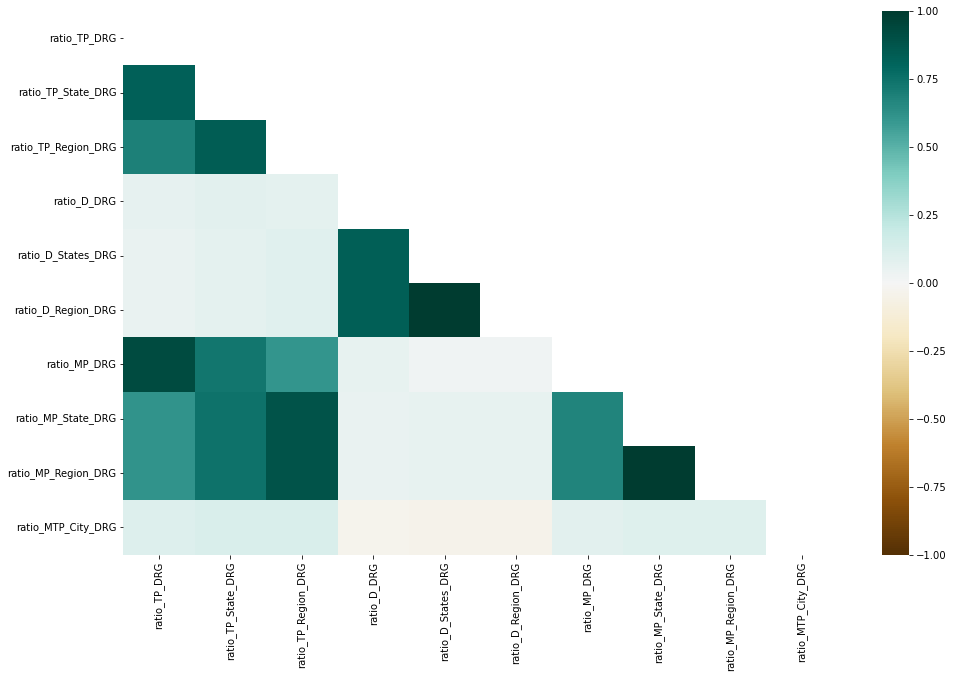

In [8]:
correlation = X_train.corr()
f, ax = plt.subplots(figsize=(16, 10))
mask = np.triu(np.ones_like(correlation, dtype=bool)) #mask for upper triangle
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(correlation, mask = mask,vmin=-1, vmax=1,
            cmap = 'BrBG',
            #annot=True
           )

## Models - Isolated Forest in the PyOD module

### Overview
There are 3 types of unsupervised anomaly detection approaches, including proximity-based, distribution-based, or ensemble-based methods. Proximity-based algorithms identify objects that deviate from the proximity of most of the other objects to their neighbors as anomalous. 

Another example using proximity-based algorithms is Isolated Forest. It identifies outliers in a tree structure. In other words, It does not build models on the normal points, but it isolates anomalies by randomly selecting a feature and then randomly selecting a split value. 
Samples that are found on the shorter branches of the tree are more likely to be anomalies since the tree found it simpler to distinguish them from the other data. Since it doesn't compute distince, this method is fast and suitable when working with large data sizes and high-dimensional problems.



### Modeling

#### Model development
The first model will use 5% contamination rate to construct model. It does not affect the calculation of the outlier scores and uses it to derive the threshold for the outlier scores.
The size of a tree “max_samples” is 40 observations. A large tree size doesn't affect the perforance of the model, and a small sample size can produce better iTrees.

In [9]:
isft = IForest(contamination=0.05, max_samples=40, behaviour='new')
isft.fit(X_train)

IForest(behaviour='new', bootstrap=False, contamination=0.05,
    max_features=1.0, max_samples=40, n_estimators=100, n_jobs=1,
    random_state=None, verbose=0)

* After modeling, an anomaly score for each observation in the training dataset X_Train create. 

In [10]:
# islf.decision_function: Predict raw anomaly score of X using the fitted detector.
y_train_scores = isft.decision_function(X_train)
y_train_pred = isft.predict(X_train)

# Threshold for the defined comtanimation rate
print("The threshold for the defined contamination rate:", isft.threshold_)


# count the number of normal and outliers
def count_stat(vector):
    # Because it is '0' and '1', we can run a count statistic.
    unique, counts = np.unique(vector, return_counts=True)
    return dict(zip(unique, counts))


print("The training data:", count_stat(y_train_pred))

The threshold for the defined contamination rate: -5.953540476366301e-17
The training data: {0: 154911, 1: 8154}


After declaring and fitting the model, I generated the outlier scores for the training data. It also shows the threshold at the assigned contamination rate. Any outlier score higher than the threshold is considered an outlier.

In [11]:
# show the funcation's parameters. 
isft.get_params()

{'behaviour': 'new',
 'bootstrap': False,
 'contamination': 0.05,
 'max_features': 1.0,
 'max_samples': 40,
 'n_estimators': 100,
 'n_jobs': 1,
 'random_state': None,
 'verbose': 0}

<AxesSubplot:>

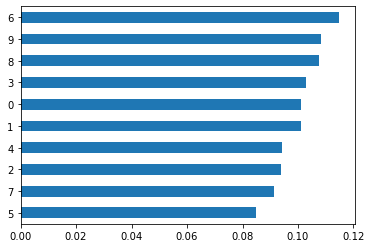

In [12]:
# relative importance of features in determining outliers
isft_vi = isft.feature_importances_

for_plot = pd.DataFrame({
    'x_axis': X_train.columns,
    'y_axis': isft_vi
}).sort_values(by='y_axis', ascending=True)
for_plot['y_axis'].plot.barh()

IForest applies a tree framework, so the relative importance of features in determining outliers. The feature importance is measured by the Gini impurity index. 

#### Threshold determination

* Method 1

Plotting the distribution of train scores

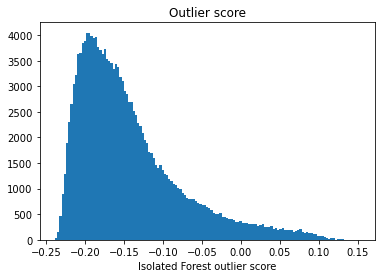

In [13]:
plt.hist(y_train_scores, bins='auto')  # arguments are passed to np.histogram
plt.title("Outlier score")
plt.xlabel('Isolated Forest outlier score')
plt.show()

The above chart displays the histogram of the Isolated Forest outlier score. We can see that it has a long tail on the right side. Right-skewed Distribution has the mean to the right of the median.

* Method 2

In statistics, the upper and lower fences represent the cut-off values for upper and lower outliers in a dataset. Since we don't have any prior knowledge on the percentage of anomalies, we use upper fences to select a reasonable threshold value. An extreme value that lies outside the lower or upper whiskers is designated an “Outlier”.

In [14]:
#plot statistics of anomaly score
fig = px.box(y_train_scores, width=600, height=400)
fig.show()

The boxplot shows the upper fence is 0.003. Scores above it, are far from the central part of the distribution, could be considered outliers and need to be further investigated. 

Score's upper fence is:  0.0032335283332554088


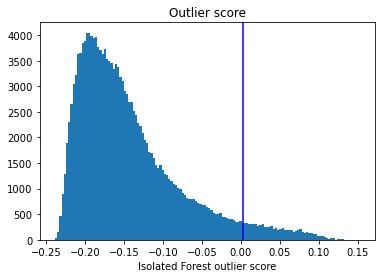

In [15]:
#get upper fence value
def uppervalue(data):
    Q3 = np.quantile(data, 0.75)
    Q1 = np.quantile(data, 0.25)
    IQR = Q3 - Q1
    upper_value = Q3 + 1.5 * IQR

    print("Score's upper fence is: ", upper_value)
    return upper_value


#plot the distribution with upper fence
def plotupper(data, line):
    plt.hist(data, bins='auto')  # arguments are passed to np.histogram
    plt.title("Outlier score")
    plt.xlabel('Isolated Forest outlier score')
    plt.axvline(x=line, color='b', label='thredhold')
    plt.show()


threshold_upper = uppervalue(y_train_scores)
plotupper(y_train_scores, threshold_upper)

The chart displays the distribution of train scores with upper fence line. 

#### Descriptive statistics of the normal and abnormal groups

In [17]:
#threshold = threshold_upper#isft.threshold_  # Or other value from the above histogram

def descriptive_stat_threshold(df, pred_score, threshold):
    # Let's see how many '0's and '1's.
    df = pd.DataFrame(df)
    df['Anomaly_Score'] = pred_score
    df['Group'] = np.where(df['Anomaly_Score'] < threshold, 'Normal',
                           'Outlier')

    # Now let's show the summary statistics:
    cnt = df.groupby('Group')['Anomaly_Score'].count().reset_index().rename(
        columns={'Anomaly_Score': 'Count'})
    cnt['Count %'] = (cnt['Count'] /
                      cnt['Count'].sum()) * 100  # The count and count %
    stat = df.groupby('Group').mean().round(2).reset_index()  # The avg.
    stat = cnt.merge(stat, left_on='Group',
                     right_on='Group')  # Put the count and the avg. together
    return (stat)

descriptive_stat_threshold(X_train, y_train_scores, threshold_upper)

,Group,Count,Count %,ratio_TP_DRG,ratio_TP_State_DRG,ratio_TP_Region_DRG,ratio_D_DRG,ratio_D_States_DRG,ratio_D_Region_DRG,ratio_MP_DRG,ratio_MP_State_DRG,ratio_MP_Region_DRG,ratio_MTP_City_DRG,Anomaly_Score
0,Normal,155298,95.236869,0.97,0.97,0.98,0.98,0.98,0.98,0.96,0.98,0.98,0.98,-0.15
1,Outlier,7767,4.763131,1.65,1.53,1.41,1.41,1.30,1.30,1.72,1.45,1.45,1.34,0.05


The above table shows descriptive statistics of the features between the normal and abnormal groups when setting upper fence as threshold. It is helpful to communicate the soundness of the model. The table shows the count and count percentage of the normal and outlier groups.

Summary:
* The size of the outlier group: The outlier group is about 4.76% at the threshold for the defined comtanimation rate. 
* The average anomaly score: The average ECOD score of the outlier group is far higher than that of the normal group (0.05 > -0.15). 
* The feature statistics in each group: The table shows the outlier group has larger values for each feature than those of the normal group. 
* From the summary statistics, ratio_TP_DRG, ratio_TP_State_DRG, and ratio_MP_DRG in the outliers are 0.68, 0.56, and 0.76 higher than those in the normals respectively. 

The business insight:
We expect that the outlier group should have higher amounts than the normal groups. The difference in average anomaly score just verifies the data in the outlier group are outliers. Each feature statistics in each group is higher than the normal group. Therefore the feature statistics prove the effectiveness of the model because the suspect observations who commit abuse or fraud will have higher amounts than normal groups.

### Modeling - Aggregate to Achieve Model Stability
The second model will improve Model Stability by Aggregating Multiple Models since Isolated Forest is a proximity-based algorism. It is sensitive to outliers and can commit overfitting. Therefore, I will build 5 Isolated Forest models with a range of the number of trees and then aggregate these scores produced by them. 
The aggregation can use Average, Maximum of Maximum (MOM), Average of Maximum (AOM), and Maximum of Average (MOA). This strategy could help to prevent the overfitting issue and improve the model's accuracy. 

In [18]:
# prepare data
X_train_agg = X_train.iloc[:,0:10] # select X_train columns
X_train_agg.shape

(163065, 10)

#### Average

Model development

In [19]:
# Standardize data
X_train_norm = standardizer(X_train_agg)

# Test a range of the number of trees
k_list = [100, 200, 300, 400, 500]
n_clf = len(k_list)
# Just prepare data frames so we can store the model results
train_scores = np.zeros([X_train.shape[0], n_clf])

# Modeling
for i in range(n_clf):
    k = k_list[i]
    #isft = IForest(contamination=0.05, max_samples=k)
    isft = IForest(contamination=0.05, n_estimators=k)
    isft.fit(X_train_norm)

    # Store the results in each column:
    train_scores[:, i] = isft.decision_function(X_train_norm)
    print("The threshold with", k, "different number of trees for the default comtanimation rate:",
          isft.threshold_)
# Decision scores have to be normalized before combination
train_scores_norm = standardizer(train_scores)

The threshold with 100 different number of trees for the default comtanimation rate: -4.4106064354715487e-17
The threshold with 200 different number of trees for the default comtanimation rate: -2.1102767089656825e-17
The threshold with 300 different number of trees for the default comtanimation rate: -1.6507740405744334e-16
The threshold with 400 different number of trees for the default comtanimation rate: -7.280354060769118e-17
The threshold with 500 different number of trees for the default comtanimation rate: -9.975337613224444e-17


Threshold determination

Score's upper fence is:  1.9882870273898336


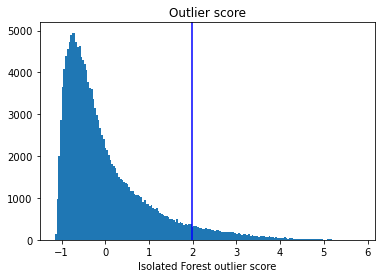

In [20]:
# Combination by average
# The test_scores_norm is 163065 x 5. The "average" function will take the average of the 10 columns. The result "y_train_by_average" is a single column:
y_train_by_average = average(train_scores_norm)

threshold_upper_avg = uppervalue(y_train_by_average)
plotupper(y_train_by_average, threshold_upper_avg)

The above chart displays the histogram of the score. We can see that it has a long tail on the right side. The statistics' the upper fence suggests a threshold of 1.98. Scores above 1.98 are far from the central part of the distribution.

Descriptive statistics of the normal and abnormal groups

In [21]:
descriptive_stat_threshold(X_train,y_train_by_average, threshold_upper_avg)

,Group,Count,Count %,ratio_TP_DRG,ratio_TP_State_DRG,ratio_TP_Region_DRG,ratio_D_DRG,ratio_D_States_DRG,ratio_D_Region_DRG,ratio_MP_DRG,ratio_MP_State_DRG,ratio_MP_Region_DRG,ratio_MTP_City_DRG,Anomaly_Score
0,Normal,153782,94.307178,0.97,0.97,0.98,0.95,0.96,0.96,0.96,0.98,0.98,0.97,-0.17
1,Outlier,9283,5.692822,1.54,1.43,1.33,1.83,1.64,1.64,1.59,1.34,1.34,1.44,2.86


#### Average of Maximum (AOM)

Score's upper fence is:  1.9882870273898336


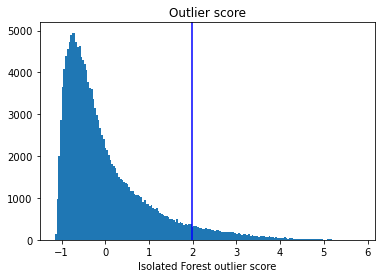

In [22]:
# Combination by Average of Maximum (AOM)
# The test_scores_norm is 163065 x 5. The "Average of Maximum (AOM)" function will take the Average of Maximum (AOM) of the 10 columns. The result "y_train_by_aom" is a single column:
y_train_by_aom = aom(train_scores_norm)

thredhold_upper_aom = uppervalue(y_train_by_aom)
plotupper(y_train_by_aom, thredhold_upper_aom)

The above chart displays the histogram of the score. We can see that it has a long tail on the right side. The statistics' the upper fence suggests a threshold of 1.98. Scores above 1.98 are far from the central part of the distribution.

Descriptive statistics of the normal and abnormal groups

In [24]:
descriptive_stat_threshold(X_train,y_train_by_aom, thredhold_upper_aom)

,Group,Count,Count %,ratio_TP_DRG,ratio_TP_State_DRG,ratio_TP_Region_DRG,ratio_D_DRG,ratio_D_States_DRG,ratio_D_Region_DRG,ratio_MP_DRG,ratio_MP_State_DRG,ratio_MP_Region_DRG,ratio_MTP_City_DRG,Anomaly_Score
0,Normal,153782,94.307178,0.97,0.97,0.98,0.95,0.96,0.96,0.96,0.98,0.98,0.97,-0.17
1,Outlier,9283,5.692822,1.54,1.43,1.33,1.83,1.64,1.64,1.59,1.34,1.34,1.44,2.86


#### Maximum of Average (MOA)

Score's upper fence is:  2.202055183584188


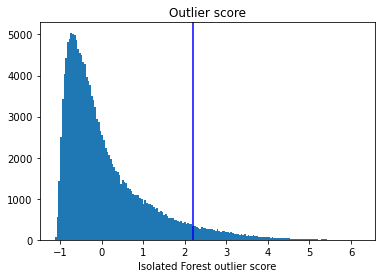

In [25]:
# Combination by Maximum of Average (MOA)
# The test_scores_norm is 163065 x 5. The "Maximum of Average (MOA)" function will take the Maximum of Average (MOA) of the 10 columns. The result "y_train_by_aom" is a single column:
y_train_by_moa = maximization(train_scores_norm)

threshold_upper_moa = uppervalue(y_train_by_moa)
plotupper(y_train_by_moa, threshold_upper_moa)

The above chart displays the histogram of the score. We can see that it has a long tail on the right side. The statistics' the upper fence suggests a threshold of 2.22. Scores above 2.22 are far from the central part of the distribution.

Descriptive statistics of the normal and abnormal groups

In [26]:
descriptive_stat_threshold(X_train,y_train_by_moa, threshold_upper_moa)

,Group,Count,Count %,ratio_TP_DRG,ratio_TP_State_DRG,ratio_TP_Region_DRG,ratio_D_DRG,ratio_D_States_DRG,ratio_D_Region_DRG,ratio_MP_DRG,ratio_MP_State_DRG,ratio_MP_Region_DRG,ratio_MTP_City_DRG,Anomaly_Score
0,Normal,154121,94.515071,0.97,0.97,0.98,0.95,0.96,0.96,0.97,0.98,0.98,0.97,-0.07
1,Outlier,8944,5.484929,1.55,1.44,1.32,1.83,1.64,1.64,1.60,1.34,1.34,1.45,3.08


#### Maximum of Maximum (MOM) 

Score's upper fence is:  2.202055183584188


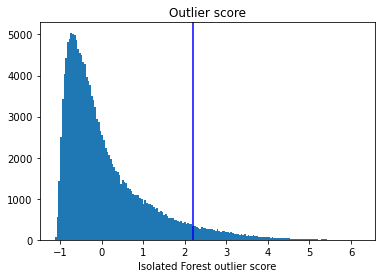

In [27]:
# Combination by Maximum of Maximum (MOM)
# The test_scores_norm is 163065 x 5. The "Maximum of Maximum (MOM)" function will take the Maximum of Maximum (MOM) of the 10 columns. The result "y_train_by_mom" is a single column:
y_train_by_maximization = maximization(train_scores_norm)

threshold_upper_maximization = uppervalue(y_train_by_maximization)
plotupper(y_train_by_maximization, threshold_upper_maximization)

The above chart displays the histogram of the score. We can see that it has a long tail on the right side. The statistics' the upper fence suggests a threshold of 2.22. Scores above 2.22 are far from the central part of the distribution.

Descriptive statistics of the normal and abnormal groups

In [28]:
descriptive_stat_threshold(X_train,y_train_by_maximization, threshold_upper_maximization)

,Group,Count,Count %,ratio_TP_DRG,ratio_TP_State_DRG,ratio_TP_Region_DRG,ratio_D_DRG,ratio_D_States_DRG,ratio_D_Region_DRG,ratio_MP_DRG,ratio_MP_State_DRG,ratio_MP_Region_DRG,ratio_MTP_City_DRG,Anomaly_Score
0,Normal,154121,94.515071,0.97,0.97,0.98,0.95,0.96,0.96,0.97,0.98,0.98,0.97,-0.07
1,Outlier,8944,5.484929,1.55,1.44,1.32,1.83,1.64,1.64,1.60,1.34,1.34,1.45,3.08


Summary:
The Anomaly Score with all 4 aggregation methods have larger differences than the base model, so the base model may memorize the data it has seen and is unable to generalize to unseen examples. Specifically, the top 4 features difference with the average aggregation method are ratio_D_DRG, ratio_D_States_DRG, ratio_D_Region_DRG, and ratio_MP_DRG while those with the base model are ratio_TP_DRG, ratio_TP_State_DRG, andratio_D_DRG, and ratio_MP_DRG. As a result, the aggregation helps to produce a stable prediction outcome. All four aggregation methods have slight differences in descriptive statistics of the normal and abnormal groups. I choose the average prediction of these models as the final model prediction because it has the largest number of outliers. We could further investigate these observations. 